# VISUALIZACIÓN Y ESTUDIO DE LAS GASOLINAS Y GASOLEOS EN ESPAÑA

## Lectura de archivos Json y creacion de Dataframes

In [1]:
import requests
import json
import pandas as pd
import numpy as np
import random

In [2]:
#Leeremos el primer json
url = "https://sedeaplicaciones.minetur.gob.es/ServiciosRESTCarburantes/PreciosCarburantes/EstacionesTerrestres/"
#json.dumps nos permite convertir objetos de python en strings de json
payload = json.dumps(
        {
	        "Fecha":"Contenido de la cadena",
	        "ListaEESSPrecio":[{
                "C.P_":"Contenido de la cadena",
                "Dirección":"Contenido de la cadena",
                "Horario":"Contenido de la cadena",
                "Latitud":"Contenido de la cadena",
                "Localidad":"Contenido de la cadena",
                "Longitud_x0020__x0028_WGS84_x0029_":"Contenido de la cadena",
                "Margen":"Contenido de la cadena",
                "Municipio":"Contenido de la cadena",
                "Precio_x0020_Biodiesel":"Contenido de la cadena",
                "Precio_x0020_Bioetanol":"Contenido de la cadena",
                "Precio_x0020_Gas_x0020_Natural_x0020_Comprimido":"Contenido de la cadena",
                "Precio_x0020_Gas_x0020_Natural_x0020_Licuado":"Contenido de la cadena",
                "Precio_x0020_Gases_x0020_licuados_x0020_del_x0020_petróleo":"Contenido de la cadena",
                "Precio_x0020_Gasoleo_x0020_A":"Contenido de la cadena",
                "Precio_x0020_Gasoleo_x0020_B":"Contenido de la cadena",
                "Precio_x0020_Gasoleo_x0020_Premium":"Contenido de la cadena",
                "Precio_x0020_Gasolina_x0020_95_x0020_E10":"Contenido de la cadena",
                "Precio_x0020_Gasolina_x0020_95_x0020_E5":"Contenido de la cadena",
                "Precio_x0020_Gasolina_x0020_95_x0020_E5_x0020_Premium":"Contenido de la cadena",
                "Precio_x0020_Gasolina_x0020_98_x0020_E10":"Contenido de la cadena",
                "Precio_x0020_Gasolina_x0020_98_x0020_E5":"Contenido de la cadena",
                "Precio_x0020_Hidrogeno":"Contenido de la cadena",
                "Provincia":"Contenido de la cadena",
                "Remisión":"Contenido de la cadena",
                "Rótulo":"Contenido de la cadena",
                "Tipo_x0020_Venta":"Contenido de la cadena",
                "_x0025__x0020_BioEtanol":"Contenido de la cadena",
                "_x0025__x0020_Éster_x0020_metílico":"Contenido de la cadena",
                "IDEESS":"Contenido de la cadena",
                "IDMunicipio":"Contenido de la cadena",
                "IDProvincia":"Contenido de la cadena",
                "IDCCAA":"Contenido de la cadena"
	        }],
	        "Nota":"Contenido de la cadena",
	        "ResultadoConsulta":"Contenido de la cadena"
        }
    )
def getInfo():
    # con la funcion requests mandamos una peticion get a la url con el payload
    response = requests.get(url, data=payload)
    # si la peticion pasa con codigo 200 (ok)
    if response.status_code == 200:
        # insertaremos el json de la respuesta en data
        data = response.json()
        # solo sacaremos la lista de precios en el return
        return data if "ListaEESSPrecio" in data  else[]
# Ejecutamos la funcion para devolver el string en JSON que se guardara en datos
datos = getInfo()
# Con la funcoon json_normalize normalizaremos y guardaremos los datos de la ruta indicada
pg = pd.json_normalize(datos, record_path =['ListaEESSPrecio'])
pg.rename(columns = {'Longitud (WGS84)':'Longitud','Tipo Venta':'Tipo_Venta','Precio Gasoleo A': 'P_Gasoleo_A','Precpgio Gasoleo B': 'P_Gasoleo_B','Precio Gasolina 95 E5':'P_Gasolina_95','Precio Gasolina 95 E5 Premium':'P_Gasolina_95_Premium','Precio Gasolina 98 E5':'P_Gasolina_98' }, inplace = True)

In [3]:
# Haremos una lectura del csv con los planes de descuento
# Crearemos un dataframe dg(Descuentos Gasolina)
file = r'Xcels\planesDescuento.xls'
dg = pd.read_excel(file)

In [4]:
# Haremos la lectura del csv con la evolucion del consumo de la gasolina y el gasoleo
file = r'Xcels\Parque_Nac_Veh__CCAA_Prov_tipoVeh_Carb.xlsx'
matr = pd.read_excel(file)
matr




,C.A,Provincia,Tipo_Vehiculo,Tipo_Carburante,A2005,A2006,A2007,A2008,A2009,A2010,...,A2012,A2013,A2014,A2015,A2016,A2017,A2018,A2019,A2020,A2021
0,Andalucía,Almería,Camiones y furgonetas,Gasolina,8915.0,8784.0,8456.0,8208.0,7813.0,7520.0,...,7206.0,6819.0,6508.0,6385.0,6346.0,6296.0,6319.0,6330.0,6376.0,6375.0
1,Andalucía,Almería,Camiones y furgonetas,Gasóleo,78220.0,84329.0,87443.0,88201.0,88077.0,88183.0,...,87647.0,87225.0,87051.0,87674.0,88348.0,89371.0,90145.0,90816.0,91899.0,92589.0
2,Andalucía,Almería,Camiones y furgonetas,Otros,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,1.0,10.0,16.0,29.0,54.0,80.0,90.0,119.0
3,Andalucía,Almería,Camiones y furgonetas,Subtotal camiones y furgonetas,87135.0,93113.0,95899.0,96410.0,95891.0,95704.0,...,94853.0,94044.0,93560.0,94069.0,94710.0,95696.0,96518.0,97226.0,98365.0,99083.0
4,Andalucía,Almería,Autobuses,Gasolina,8.0,7.0,7.0,7.0,7.0,9.0,...,9.0,11.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,Total,Subtotal La Rioja,Total todos los vehículos,Gasolina,14428402.0,14536169.0,14615394.0,14627619.0,14261823.0,14115696.0,...,13850018.0,13510906.0,13301665.0,13377186.0,13641959.0,14030385.0,14563270.0,15134743.0,15444028.0,15858225.0
1609,Total,Subtotal La Rioja,Total todos los vehículos,Gasóleo,12862442.0,14124314.0,15283399.0,15907051.0,16155935.0,16528514.0,...,16909000.0,16959627.0,17216298.0,17541220.0,17968013.0,18367474.0,18574542.0,18633588.0,18600441.0,18529778.0
1610,Total,Subtotal La Rioja,Total todos los vehículos,Otros,366432.0,393578.0,419664.0,434554.0,438211.0,441825.0,...,444185.0,446303.0,44929.0,44767.0,52950.0,71433.0,117433.0,178637.0,222242.0,278305.0
1611,Total,Subtotal La Rioja,Total todos los vehículos,Sin especificar,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,413155.0,426510.0,443598.0,459712.0,474737.0,487823.0,498492.0,512500.0


In [5]:
# Haremos la lectura del csv con la evolucion del consumo de la gasolina y el gasoleo
file = r'Xcels\evolucion_del_consumo_de_gasolina_y_gasoleos_en_lo_que_va_de_año.csv'
evo = pd.read_csv(file)
evo

,Año,Gasolinas,Gasóleos
0,1996,6.0540,7.70
1,1997,5.9470,8.37
2,1998,5.9510,9.30
3,1999,5.9360,10.27
4,2000,5.7150,11.16
5,2001,5.6240,11.96
6,2002,5.4730,12.63
7,2003,5.4180,13.70
8,2004,5.2130,14.64
9,2005,4.9264,15.46


In [6]:
# Haremos la lectura del csv con el consumo de 95
file =r'Xcels\consumo_de_gasolina_95_en_lo_que_va_de_año.csv'
con95 = pd.read_csv(file)
con95

,Año,Periodo,Parámetro,Consumo de Gasolina 95
0,2019,Julio,Andalucía,43.459953
1,2019,Julio,Aragón,80.524470
2,2019,Julio,Asturias,51.187350
3,2019,Julio,Canarias,22.721005
4,2019,Julio,Cantabria,36.711690
5,2019,Julio,Castilla y León,15.145399
6,2019,Julio,Castilla-La Mancha,10.865508
7,2019,Julio,Cataluña,49.212751
8,2019,Julio,Comunidad Valenciana,31.298673
9,2019,Julio,Extremadura,54.657060


In [7]:
# Haremos la lectura del csv con el consumo de Gasoleo A por comunidad
file = r'Xcels\consumo_de_gasoleo_a_por_comunidades_en_lo_que_va_de_año.csv'
conGA = pd.read_csv(file)
dict1 = {'Andalucía':'Andalucía','Aragón':'Aragón','Canarias':'Canarias','Cantabria':'Cantabria',
'Castilla y León':'Castilla y León','Cataluña':'Cataluña','Extremadura':'Extremadura','Galicia':'Galicia',
'La Rioja':'La Rioja','País Vasco':'País Vasco',
'Castilla-La Mancha':'Castilla - La Mancha','Navarra':'Comunidad Foral de Navarra',
'Madrid':'Comunidad de Madrid','Comunidad Valenciana':'Comunitat Valenciana',
'Islas Baleares':'Illes Balears','Asturias':'Principado de Asturias'
,'Murcia':'Región de Murcia'}
conGA


,Año,Periodo,Parámetro,Consumo de Gasoleo A
0,2019,Julio,Andalucía,33.550022
1,2019,Julio,Aragón,82.804860
2,2019,Julio,Asturias,40.431530
3,2019,Julio,Canarias,58.403700
4,2019,Julio,Cantabria,29.579630
5,2019,Julio,Castilla y León,16.846820
6,2019,Julio,Castilla-La Mancha,12.324040
7,2019,Julio,Cataluña,35.439381
8,2019,Julio,Comunidad Valenciana,20.745580
9,2019,Julio,Extremadura,64.126890


In [8]:
# Haremos la lectura del csv con el consumo de Carburantes por comunidad
file = r'Xcels\consumo_de_carburantes_en_españa.csv'
conCarb = pd.read_csv(file)
conCarb

,Año,Periodo,Gasolina,Gasóleos
0,2007-8,Agosto,632.326,2183.241
1,2007-9,Septiembre,536.530,2083.236
2,2007-10,Octubre,573.272,2321.597
3,2007-11,Noviembre,517.522,2187.660
4,2007-12,Diciembre,532.406,2060.384
...,...,...,...,...
140,2019-4,Abri,437.959,1971.198
141,2019-5,Mayo,455.157,2048.498
142,2019-6,Junio,454.009,1957.365
143,2019-7,Julio,523.472,2165.693


In [9]:
# Haremos la lectura del csv con la variacion de precios por año y mes
file = r'Xcels\var_precios.csv'
prec = pd.read_csv(file)
prec

,Fecha,gasolina,diesel
0,20-1,1.31,1.24
1,20-2,1.29,1.20
2,20-3,1.21,1.11
3,20-4,1.10,1.01
4,20-5,1.08,0.99
5,20-6,1.12,1.02
6,20-7,1.16,1.05
7,20-8,1.16,1.06
8,20-9,1.16,1.03
9,20-10,1.15,1.02


In [10]:
# Haremos la lectura del csv con la variacion de precios por año y mes
file = r'Xcels\precioseucsv1.csv'
preceu1 = pd.read_csv(file)
preceu1

,Date,Gasolina_95,Diesel
0,2022-11-14,854.69,742.09
1,2022-11-07,856.85,750.33
2,2022-10-31,853.76,754.11
3,2022-10-24,852.58,753.54
4,2022-10-17,856.19,752.89
...,...,...,...
146,2019-12-02,867.01,732.04
147,2019-11-25,866.03,731.05
148,2019-11-18,865.91,731.28
149,2019-11-11,865.51,730.84


In [11]:
# Haremos la lectura del csv con la variacion de precios por año y mes
file = r'Xcels\precioseucsv.csv'
preceu = pd.read_csv(file)
# Cambiaremos un poco los datos dado qe conseguimos los precios cada 1000 litros
preceu['Gasolina_95']=preceu['Gasolina_95']/1000
preceu['Diesel']=preceu['Diesel']/1000
preceu

,Date,Gasolina_95,Diesel
0,2022-11-14,0.85469,0.74209
1,2022-11-07,0.85685,0.75033
2,2022-10-31,0.85376,0.75411
3,2022-10-24,0.85258,0.75354
4,2022-10-17,0.85619,0.75289
...,...,...,...
879,2005-01-31,0.73186,0.55034
880,2005-01-24,0.72809,0.54845
881,2005-01-17,0.72643,0.54750
882,2005-01-10,0.72649,0.54849


In [12]:
# Haremos la lectura del csv con la evolucion del consumo de la gasolina y el gasoleo
file = r'Xcels\Parque_Nac_Veh__CCAA_Prov_tipoVeh_Carb.xlsx'
matr = pd.read_excel(file)
matr

,C.A,Provincia,Tipo_Vehiculo,Tipo_Carburante,A2005,A2006,A2007,A2008,A2009,A2010,...,A2012,A2013,A2014,A2015,A2016,A2017,A2018,A2019,A2020,A2021
0,Andalucía,Almería,Camiones y furgonetas,Gasolina,8915.0,8784.0,8456.0,8208.0,7813.0,7520.0,...,7206.0,6819.0,6508.0,6385.0,6346.0,6296.0,6319.0,6330.0,6376.0,6375.0
1,Andalucía,Almería,Camiones y furgonetas,Gasóleo,78220.0,84329.0,87443.0,88201.0,88077.0,88183.0,...,87647.0,87225.0,87051.0,87674.0,88348.0,89371.0,90145.0,90816.0,91899.0,92589.0
2,Andalucía,Almería,Camiones y furgonetas,Otros,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,1.0,10.0,16.0,29.0,54.0,80.0,90.0,119.0
3,Andalucía,Almería,Camiones y furgonetas,Subtotal camiones y furgonetas,87135.0,93113.0,95899.0,96410.0,95891.0,95704.0,...,94853.0,94044.0,93560.0,94069.0,94710.0,95696.0,96518.0,97226.0,98365.0,99083.0
4,Andalucía,Almería,Autobuses,Gasolina,8.0,7.0,7.0,7.0,7.0,9.0,...,9.0,11.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,Total,Subtotal La Rioja,Total todos los vehículos,Gasolina,14428402.0,14536169.0,14615394.0,14627619.0,14261823.0,14115696.0,...,13850018.0,13510906.0,13301665.0,13377186.0,13641959.0,14030385.0,14563270.0,15134743.0,15444028.0,15858225.0
1609,Total,Subtotal La Rioja,Total todos los vehículos,Gasóleo,12862442.0,14124314.0,15283399.0,15907051.0,16155935.0,16528514.0,...,16909000.0,16959627.0,17216298.0,17541220.0,17968013.0,18367474.0,18574542.0,18633588.0,18600441.0,18529778.0
1610,Total,Subtotal La Rioja,Total todos los vehículos,Otros,366432.0,393578.0,419664.0,434554.0,438211.0,441825.0,...,444185.0,446303.0,44929.0,44767.0,52950.0,71433.0,117433.0,178637.0,222242.0,278305.0
1611,Total,Subtotal La Rioja,Total todos los vehículos,Sin especificar,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,413155.0,426510.0,443598.0,459712.0,474737.0,487823.0,498492.0,512500.0


In [13]:
g = ['C_Diesel'] #Array de consumo
g1 = ['Dif_matr'] # diferencia de consumo
cpr = [] # array de comunidades
f = ['M_Diesel'] # Array de matriculaciones
c1 = ['C.A'] # array de comunidades filtrado
r  =['Rel_M/C'] # array de relacion
for val in conGA['Parámetro']:
    if val not in cpr:
        cpr.append(val)
cpr = sorted(cpr)
for c in cpr:
    if c != 'Ceuta' or c != 'Melilla'or c != 'Total':
        # Matriculaciones diesel
        a = matr['A2019'].loc[((matr['C.A'] == dict1[c])
        & (matr['Tipo_Carburante'] == 'Gasóleo'))]
        a = round(a.mean())
        # Consumo diesel
        a2 = round(conGA['Consumo de Gasoleo A'].loc[(conGA['Parámetro']== c)].mean(),2)
        # Ratio entre consumo y matriculaciones gasoleo 2019
        a1 = round((a2/a)*100,3)
        # Diferencia matriculaciones diesel y gasolina
        b = matr['A2019'].loc[((matr['C.A'] == dict1[c])
        & (matr['Tipo_Carburante'] == 'Gasolina'))]
        b = round(b.mean())
        # Metemos los valores en los arrays
        f.append(a)
        g.append(a2)
        r.append(a1)
        c1.append(c)
        g1.append(a-b)
        
data = [c1,g,f,g1,r]
dm  =pd.DataFrame(data = data)
dm = dm.transpose()

dm.columns = dm.iloc[0]
dm = dm.set_index('C.A')
dm = dm.apply(pd.to_numeric, errors='coerce', axis=1)
dm = dm.iloc[1:]

# dm = dm.set_index('C.A')
dm['C_Diesel'] = dm['C_Diesel'].apply(pd.to_numeric, errors='coerce')
dm['M_Diesel'] = dm['M_Diesel'].apply(pd.to_numeric, errors='coerce')
dm['Dif_matr'] = dm['Dif_matr'].apply(pd.to_numeric, errors='coerce')
dm['Rel_M/C'] = dm['Rel_M/C'].apply(pd.to_numeric, errors='coerce')
print(dm.dtypes)
dm

0
C_Diesel    float64
M_Diesel    float64
Dif_matr    float64
Rel_M/C     float64
dtype: object


,C_Diesel,M_Diesel,Dif_matr,Rel_M/C
C.A,,,,
Andalucía,33.55,73048.0,24099.0,0.046
Aragón,82.80,28310.0,8343.0,0.292
Asturias,40.43,67617.0,20897.0,0.060
Canarias,58.40,47821.0,-47516.0,0.122
Cantabria,29.58,41238.0,12899.0,0.072
Castilla y León,16.85,20203.0,7174.0,0.083
Castilla-La Mancha,12.32,34658.0,17705.0,0.036
Cataluña,35.44,101917.0,-15216.0,0.035
Comunidad Valenciana,20.75,103396.0,9496.0,0.020


## Creacion de listas y diccionarios que necesitaremos


In [17]:
# Diccionario con comunidad autonoma como key y la lista de provincias como values
coms = {"Galicia":{"Lugo"},"Andalucía":{"Almería","Cádiz","Córdoba","Granada","Huelva","Jaén","Málaga","Sevilla"}
,"Valencia":{"Alicante"},"Castilla la mancha":{"Albacete","Ciudad Real","Cuenca","Guadalajara","Toledo"}
,"Castilla y León":{"León","Burgos","Palencia","Salamanca","Segovia","Soria","Valladolid","Zamora"}
,"Comunidad de Madrid":{"Madrid"},"Extremadura":{"Badajoz","Cáceres"},"Asturias":{"Asturias"}
,"Cataluña":{"Barcelona","Tarragona"}, "Cantabria":{"Cantabria"},"Aragón":{"Huesca","Zaragoza","Teruel"}
,"Navarra":{"Navarra"},"Murcia":{"Murcia"},"Baleares":{"BALEARS (ILLES)"}, "Pais Vasco":{"Araba, Bizkaia, Gipuzkoa"}, "La Rioja":{"La Rioja"}
                    ,"Ceuta":{"Ceuta"},"Melilla":{"Melilla"},"Canarias":{"Canarias"} }
# Lista con todas las provincias
prov = ["Albacete","Alicante","Almería","Asturias","Badajoz","Barcelona","Burgos","Cáceres",
"Cádiz","Cantabria","Ciudad Real","Córdoba","Cuenca","Granada","Guadalajara",
"Huelva","Huesca","Jaén","León","Lugo","Madrid","Málaga","Murcia","Navarra",
"Palencia","Salamanca","Segovia","Sevilla","Soria","Tarragona"
,"Teruel","Toledo","Valladolid","Zamora","Zaragoza","BALEARS (ILLES)"]
# Lista con los tipos de gasolina
tipo = ['P_Gasoleo_A', 'P_Gasoleo_B' , 'P_Gasolina_95', "P_Gasolina_95_Premium", 'P_Gasolina_98']
# Diccionario con los nombres de las columnas
dic_type = {'C.P.','Latitud','Longitud','P_Gasoleo_A','P_Gasoleo_B','P_Gasolina_95','P_Gasolina_95_Premium','P_Gasolina_98'}
#generaremos una lista con los precios medios por provincia y por gasolina antes de hacer el replace para conseguir valores medios exactos:
l = []
for pro in prov:  
    s = [] 
    for i in tipo:
        s.append(round(pg[str(i)].where(pg['Provincia']== pro.upper()).mean(),3))
    s[3] = 1.956
    l.append(s)
# Sacaremos el diccionario media precios con la media de precios por provincia
m_p = dict(zip(prov,l))
#generaremos una lista con los provincia medios por comunidad y por gasolina antes de hacer el replace para conseguir valores medios exactos:
l1 = []
for com in coms:  
    s1 = [] 
    for i in tipo:
        s1.append(round(pg[str(i)].where(pg['C.A']== com).mean(),3))
    s1[3] = 1.956
    l1.append(s1)
# Sacaremos el diccionario media comunidad con la media de precios por comunidad
m_c = dict(zip(coms,l)) 
mc = pd.DataFrame(m_c)
mcn = []
ar = [12,1,10,8,7,13,11,3,9,6,2,15,14,4,16,17,18,19,5]
iar = 0
for com in coms:
    mcm = []
    mcm.append(com)
    mcm.append(round(mc[com].mean(),3))
    mcm.append(ar[iar])
    mcn.append(mcm)
    iar +=1
mc1 = pd.DataFrame(data = mcn, columns = ['Nombre','Media','ccaa'])


## Depuracion de las tablas

In [18]:
# Crearemos nuevamente la tabla para no sobreescribir datos
pg = pd.json_normalize(datos, record_path =['ListaEESSPrecio'])
# Haremos el replace para generar mejores datos
pg= pg.replace('', '0', regex=True)
# Eliminaremos tablas que no neceitemos
del(pg['Horario'],pg['Margen'],pg['Precio Biodiesel'],pg['Precio Bioetanol'],pg['Precio Gas Natural Comprimido'],pg['Precio Gas Natural Licuado'],pg['Precio Gases licuados del petróleo'],pg['Precio Gasoleo Premium'],pg['Precio Gasolina 95 E10'],pg['Precio Gasolina 98 E10'],pg['Precio Hidrogeno'],pg['% BioEtanol'],pg['Remisión'],pg['Rótulo'],pg['% Éster metílico'],pg['IDCCAA'],pg['IDEESS'],pg['IDMunicipio'],pg['IDProvincia'])
# Crearemos una funcion para generar las comunidades autonomas de cada provincias
coms = {"Galicia":{"Lugo"},"Andalucía":{"Almería","Cádiz","Córdoba","Granada","Huelva","Jaén","Málaga","Sevilla",}
,"Valencia":{"Alicante"},"Castilla la mancha":{"Albacete","Ciudad Real","Cuenca","Guadalajara","Toledo"}
,"Castilla y León":{"León","Burgos","Palencia","Salamanca","Segovia","Soria","Valladolid","Zamora"}
,"Comunidad de Madrid":{"Madrid"},"Extremadura":{"Badajoz","Cáceres"},"Asturias":{"Asturias"}
,"Cataluña":{"Barcelona","Tarragona"}, "Cantabria":{"Cantabria"},"Aragón":{"Huesca","Zaragoza","Teruel"}
,"Navarra":{"Navarra"},"Murcia":{"Murcia"},"Baleares":{"BALEARS (ILLES)"}, "Pais Vasco":{"Araba, Bizkaia, Gipuzkoa"}, "La Rioja":{"La Rioja"},
       "Ceuta":{"Ceuta"},"Melilla":{"Melilla"},"Canarias":{"Canarias"} }
# Dejaremos el diccionario provisionalmente para evitar conflictos en la ejecucion
def select_ca(row):
    for com in coms:
        for i in coms[com]:
            if row['Provincia'] == str(i).upper():
                return com
    return
# Y crearemos una columna con esas comunidades
pg['C.A']= pg.apply(select_ca,axis=1)
# Reorganizaremos las columnas como nosotros queramos
pg = pg.iloc[:,[13,11,3,1,2,4,6,7,8,9,10,12,0]]
# Renombraremos columnas como queramos
pg.rename(columns = {'Longitud (WGS84)':'Longitud','Tipo Venta':'Tipo_Venta','Precio Gasoleo A': 'P_Gasoleo_A','Precio Gasoleo B': 'P_Gasoleo_B','Precio Gasolina 95 E5':'P_Gasolina_95','Precio Gasolina 95 E5 Premium':'P_Gasolina_95_Premium','Precio Gasolina 98 E5':'P_Gasolina_98' }, inplace = True)
# Dado que nos dan los datos en forma de string, algunos necesitan una reconversion a int
dic_type = {'C.P.','Latitud','Longitud','P_Gasoleo_A','P_Gasoleo_B','P_Gasolina_95','P_Gasolina_95_Premium','P_Gasolina_98'}
for column in dic_type:
    pg[str(column)] = [str(val).replace(',', '.') for val in pg[str(column)]]
    pg[str(column)] = pg[str(column)].dropna()
    pg = pg[pg[str(column)].str.contains("nan")==False]
    pg[str(column)] = pd.to_numeric(pg[str(column)])
# Para tener un mejor muestreo de datos generaremos datos random para los valores que no tengan
#generaremos una lista con los precios medios por provincia y por gasolina antes de hacer el replace para conseguir valores medios exactos:
l = []
for pro in prov:  
    s = [] 
    for i in tipo:
        s.append(round(pg[str(i)].where(pg['Provincia']== pro.upper()).mean(),3))
    s[3] = 1.956
    l.append(s)
# Sacaremos el diccionario media precios con la media de precios por provincia
m_p = dict(zip(prov,l))
# Rellenamos los espacios en blanco sin valor co los precios medios de la provincia co una variacion
for i in range(pg['Provincia'].count()):
    for pro in prov:
        x = 0
        for f in tipo:
            if pg.at[i,'Provincia']== pro.upper() and pg.at[i,str(f)]==0:
                pg.at[i,str(f)] = round(m_p[pro][x] + (random.random())*0.12,3)
            x += 1    
pg

,C.A,Provincia,Localidad,Dirección,Latitud,Longitud,P_Gasoleo_A,P_Gasoleo_B,P_Gasolina_95,P_Gasolina_95_Premium,P_Gasolina_98,Tipo_Venta,C.P.
0,Castilla la mancha,ALBACETE,ABENGIBRE,"AVENIDA CASTILLA LA MANCHA, 26",39.211417,-1.539167,1.659,1.270,1.569,1.998,0.835,P,2250
1,Castilla la mancha,ALBACETE,ALBACETE,"CALLE FEDERICO GARCIA LORCA, 1",39.000861,-1.849833,1.627,0.458,1.567,2.045,0.829,P,2001
2,Castilla la mancha,ALBACETE,ALBACETE,"CALLE FEDERICO GARCIA LORCA, 5",38.997722,-1.846361,1.760,0.524,1.394,1.967,0.857,R,2001
3,Castilla la mancha,ALBACETE,ALBACETE,CALLE PRINCIPE DE ASTURIAS (POLÍGONO DE ROMICA...,39.054694,-1.832000,1.749,0.478,1.699,2.006,1.841,P,2001
4,Castilla la mancha,ALBACETE,ALBACETE,"AVENIDA 1º DE MAYO, S/N",38.985667,-1.868500,1.739,0.523,1.669,2.044,1.809,P,2001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11743,Aragón,ZARAGOZA,ZARAGOZA,"AVENIDA DIAGONAL PLAZA, 22",41.636528,-0.990111,1.769,0.652,1.709,2.067,1.869,P,50197
11744,Aragón,ZARAGOZA,ZARAGOZA,"POLIGONO CALLE TURIASO, 31",41.645722,-0.974194,1.759,0.594,1.351,2.028,0.728,P,50197
11745,Aragón,ZARAGOZA,ZUERA,"CARRETERA N-330A KM. 24,000",41.857000,-0.794000,1.739,1.363,1.679,2.017,1.809,P,50800
11746,Aragón,ZARAGOZA,ZUERA,"CALLE AUSTRIA, 11,17",41.883583,-0.782833,1.667,1.198,1.619,2.047,0.729,P,50800


In [19]:
# Pasaremos la primera fila a ser los headers de las columnas
dg.columns = dg.iloc[0]
# Eliminaremos la fila duplicada
dg.drop(dg.index[0],axis=0,inplace=True)
# Eliminaremos columnas irrelevantes
dg.drop(dg.columns[[1,2,3]], axis=1, inplace=True)
dg


,Operador,Cifra descuento,Tipo descuento,Destinatario
1,BP OIL ESPAÑA S.A.,3.000,Céntimos de euro en cada litro,Todos los consumidores
2,CARREFOUR,8.000,Porcentaje sobre el precio total,Todos los consumidores
3,CHAMPION,8.000,Porcentaje sobre el precio total,Todos los consumidores
4,"DISA PENINSULA, S.L.U",2.000,Céntimos de euro en cada litro,"Colectivos (taxis, flotas de vehículos, etc.)"
5,"DISA PENINSULA, S.L.U",2.000,Céntimos de euro en cada litro,Transportistas profesionales
...,...,...,...,...
83,"DISA PENINSULA, S.L.U",4.000,Porcentaje sobre el precio total,Todos los consumidores
84,"DISA PENINSULA, S.L.U",3.000,Porcentaje sobre el precio total,Todos los consumidores
85,"DISA PENINSULA, S.L.U",4.000,Porcentaje sobre el precio total,Todos los consumidores
86,"DISA PENINSULA, S.L.U",3.000,Porcentaje sobre el precio total,Todos los consumidores


## Creación de gráficos

In [20]:
# Importamos la libreria que nos permitira hacer graficos
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
%matplotlib inline

### Grafico mostrando la variacion del precio al que se importa la gasolina y el diesel

In [21]:
# Usando la libreria plotly podremos hacer graficos interactivos
# Crearemos la figura
fig = go.Figure()
# Añadiremos unos valores que graficar
fig.add_trace(
    go.Scatter(x = list(preceu.Date),y = list(preceu.Diesel), name = 'Diesel'))
fig.add_trace(
    go.Scatter(x = list(preceu.Date),y = list(preceu.Gasolina_95), name = 'Gasolina'))
# Añadiremos un título
fig.update_layout(
    title_text="Evolución del precio de importación de la Gasolina y el Diesel"
)
# Añadiremos un slider para poder ver la grafica en diferentes rangos
fig.update_layout(
    # Haremos botones que nos permitiran modificar los rangos en el eje x
    xaxis=dict(
        #Creamos el selector de rangos
        rangeselector=dict(
            # Los botones por mes, medio año, año hasta la fecha , un año y el total
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="AHF",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1A",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Decimos que el slider de los rangos que nos representara el rango de informacion sea visible
        rangeslider=dict(
            visible=True
        ),
        # el tipo de informacion del eje x es date yyyy-mm-dd
        type="date"
    )
)
# Le damos titulo ala eje y
fig.update_yaxes(title_text="€/L")
# Mostramos el grafico
fig.show()

#### Analisis exploratorio

##### Como podemos observar hay numerosas fluctuaciones en el precio de importación tanto de  la gasolina como el diésel. Este precio varía segun las condiciones climáticas que pueda sufrir el país que exporta el petróleo. Además de esto la catástrofes naturales y las propias guerras en esto paises produce que se vendan estos productos a mayor o menos precio dependiendo de lo dicho anteriormente. Este también se ve influido por la demandda, esto significa que a mayor demanda de este producto al mismo país más alto será el precio al que se vende. 
##### Siendo Arabia Saudita y Nigeria los principales países que importan a España, podemos comprobar como estos reunen todo lo expuesto anteriormente, tanto la demnada de este producto, como las guerras que se llevan a cabo como las condiciones climáticas extremas a las que pueden estar sometidos en ciertas épocas del año.


### Grafico mostrando la variacios del precio de la gasolina con los años

##### Esto lo compararemos con hechos historicos para dar una razón a las posibles variaciones que hayan ocurrido en el rango de tiempo en el que se encuentran nuestros datos

In [23]:
# Usando la libreria plotly podremos hacer graficos interactivos
# Crearemos la figura
fig = go.Figure()
# Añadiremos unos valores que graficar
fig.add_trace(
    go.Scatter(x = list(prec.Fecha),y = list(prec.diesel), name = 'Diesel'))
fig.add_trace(
    go.Scatter(x = list(prec.Fecha),y = list(prec.gasolina), name = 'Gasolina 95'))
# Añadiremos un título
fig.update_layout(
    title_text="Evolucion del precio de la Gasolina y el Diesel"
)
# Añadiremos un slider para poder ver la grafica en diferentes rangos
fig.update_layout(
    # Haremos botones que nos permitiran modificar los rangos en el eje x
    xaxis=dict(
        #Creamos el selector de rangos
        rangeselector=dict(
            # Los botones por mes, medio año, año hasta la fecha , un año y el total
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="AHF",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1A",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Decimos que el slider de los rangos que nos representara el rango de informacion sea visible
        rangeslider=dict(
            visible=True
        ),
        # el tipo de informacion del eje x es date yyyy-mm-dd
        type="date"
    )
)
# Le damos titulo ala eje y
fig.update_yaxes(title_text="€/L")
# Mostramos el grafico
fig.show()

#### Analisis Exploratorio

###### Como podemos observar desde la pandemia de 2020 ha habido una subida constante ya que durante esos meses los ingresos Españoles eran bajos por lo que se contrarrestó subiendo los precios. Vemos un pico a mediados del 2022 y se debe a la influencia que ha tenido la guerra de Ucrania y Rusia. Ésta a influido en todo Europa en general, dando lugar a una gran inlación en los costes de los bienes materiales, como pasó con la gasolina. Podemos ver que ese pico comenzó cuando la guerra comenzó y como a día de hoy esta sigue activa no ha vuelto como estaba antes, pero comprobamos que está bajando debido a que toda la guerra está más contralada y además se han llevado unas medidas en las gasolineras para reducir el precio por litro, con lo que podemos ver la bajadadel precio.

### Grafico mostrando la comparativa entre el precio de venta e importacion de Gasolina 95 y Diesel

In [24]:
# Usando la libreria plotly podremos hacer graficos interactivos
# Crearemos la figura
fig = go.Figure()
# Añadiremos unos valores que graficar
fig.add_trace(
    go.Scatter(x = list(prec.Fecha),y = list(prec.diesel), name = 'Diesel Precio Venta'))
fig.add_trace(
    go.Scatter(x = list(prec.Fecha),y = list(prec.gasolina), name = 'Gasolina 95 Precio Venta'))
fig.add_trace(
    go.Scatter(x = list(preceu1.Date),y = list(preceu.Diesel), name = 'Diesel Precio Compra'))
fig.add_trace(
    go.Scatter(x = list(preceu1.Date),y = list(preceu.Gasolina_95), name = 'Gasolina 95 Precio Compra'))
# Añadiremos un título
fig.update_layout(
    title_text="Evolucion del precio de la Gasolina y el Diesel"
)
# Añadiremos un slider para poder ver la grafica en diferentes rangos
fig.update_layout(
    # Haremos botones que nos permitiran modificar los rangos en el eje x
    xaxis=dict(
        #Creamos el selector de rangos
        rangeselector=dict(
            # Los botones por mes, medio año, año hasta la fecha , un año y el total
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="AHF",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1A",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Decimos que el slider de los rangos que nos representara el rango de informacion sea visible
        rangeslider=dict(
            visible=True
        ),
        # el tipo de informacion del eje x es date yyyy-mm-dd
        type="date"
    )
)
# Le damos titulo ala eje y
fig.update_yaxes(title_text="€/L")
# Mostramos el grafico
fig#### Analisis Exploratorio.show()

#### Analisis Exploratorio

###### Comparando la venta y la compra tando de la Gasolina del 95 como del Diesel, se puede ver la subida que ha tenido el precio de venta en España como hemosmencionado anteriormente.
###### Analizando por otra parte el precio de compra podemos ver que en el 2022 han habido pequeñas variaciones de los valores de compra, esto se puede deber a  la vanriancia del precio que hay. Este a su vez se compone de cuatro carácterísticas que determinan la varianza del precio como son los costes de distribución, el impuesto sobre hidrocarburos, el coste de la materia prima y el iva. Estos costes pueden variar según el valor de cotización del petróleo en los mercados internacionales, este puede variar según la extracción y la oferta y demanda que tenga y a su vez también viene afectada por las. reservas y la política con peligro de sufrir un conflicto internacional .
###### Sabiendo todo esto podemos saber y darle un significado a estos datos. Hubo una varianza en la compra del petróleo debido a la guerra que se está llevando a cabo ya que influye a grande escalal no solo en este mercado sino en muchos otros también.

### Grafico de barras comparando la evolucion del consumo entre todos los Gasoleos y Gasolinas


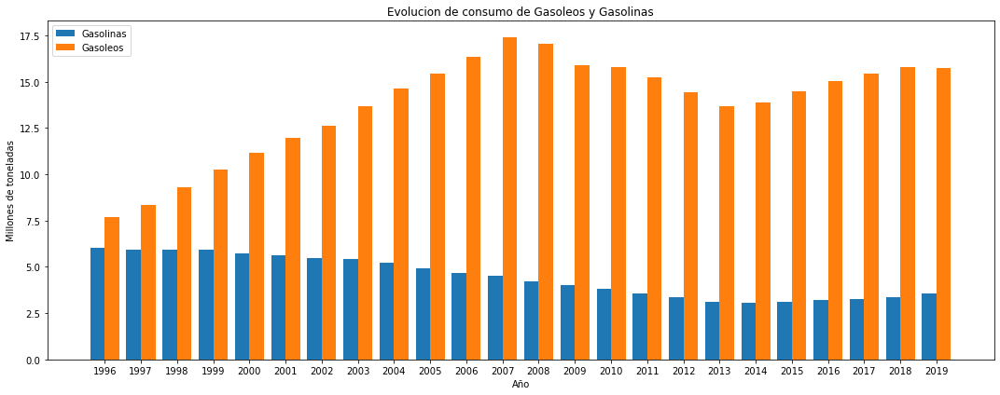

In [25]:
fig,ax  = plt.subplots(1, figsize=(15,6),tight_layout=True) 
# Generaremos una lista de valores del 0 al 4
br1 = np.arange(evo['Año'].count())
# Añadiremos 0.4 a cada elemento de la lista
br2 = [x + 0.4 for x in br1]
ax = plt.bar(br1,evo['Gasolinas'],width = 0.4, label = 'Gasolinas')
ax = plt.bar(br2,evo['Gasóleos'],width = 0.4, label = 'Gasoleos')
plt.xticks([r + 0.2 for r in range(evo['Año'].count())],evo['Año'])
plt.title('Evolucion de consumo de Gasoleos y Gasolinas')
plt.ylabel('Millones de toneladas')
plt.xlabel('Año')
plt.legend(loc = 2)
plt.show()

### Consumo Gasolina 95 por Comunidad en 2019

##### Este gráfico lo vamos a usar más tarde en el mapa interactivo que se desarrolla 

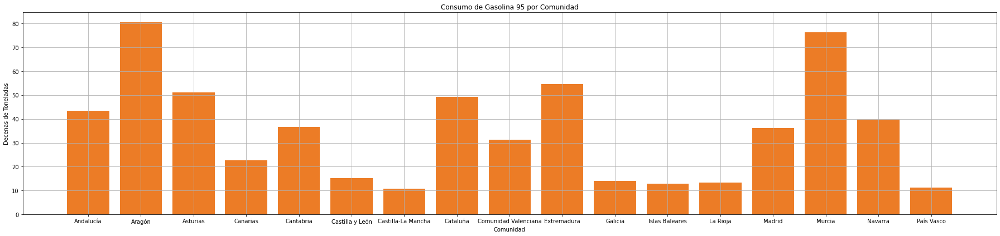

In [26]:
fig,ax  = plt.subplots(1, figsize=(25,6),tight_layout=True) 
ax= plt.bar(con95['Parámetro'],con95['Consumo de Gasolina 95'], color = '#EC7C26')
plt.title('Consumo de Gasolina 95 por Comunidad')
plt.ylabel('Decenas de Toneladas')
plt.xlabel('Comunidad')
plt.grid()
plt.show()

### Consumo Gasoleo A por comunidad 2019

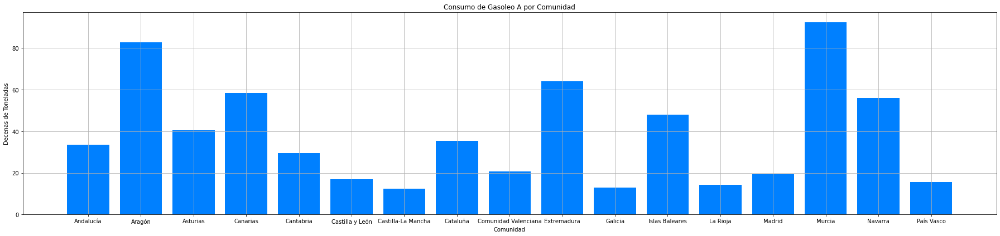

In [27]:
fig,ax  = plt.subplots(1, figsize=(25,6),tight_layout=True) 
ax= plt.bar(conGA['Parámetro'],conGA['Consumo de Gasoleo A'], color = '#0080FF')
plt.title('Consumo de Gasoleo A por Comunidad')
plt.ylabel('Decenas de Toneladas')
plt.xlabel('Comunidad')
plt.grid()
plt.show()

### Grafico de Barras comparando los precios de las gasolinas de cada provincia con los de la comunidad

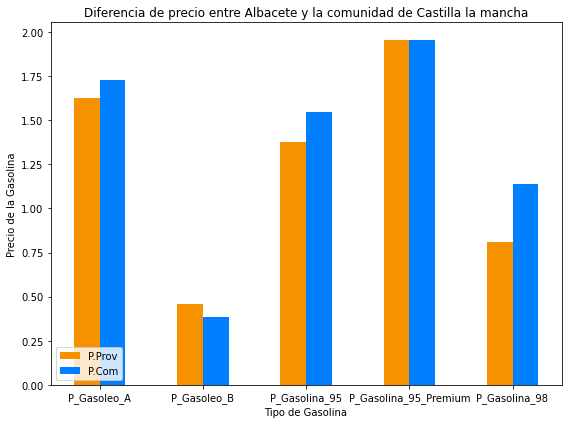

In [28]:
# Haremos un grafico por provincia
for pro in prov:
    # Declaramos la figura del grafico
    fig,ax  = plt.subplots(1, figsize=(8,6),tight_layout=True) 
    # Generamos para cada caso las listas con precio por provincia y comunidad
    for com in coms:
        x = m_p[pro]
        if pro in coms[com]:
            c = com
            y = m_c[com]
    # Generaremos una lista de valores del 0 al 4
    br1 = np.arange(len(x))
    # Añadiremos 0.25 a cada elemento de la lista
    br2 = [x + 0.25 for x in br1]
    # Crearemos los labels para la leyenda
    ax = plt.bar(0,0,color = '#F69100',width = 0.0, label = 'P.Prov')
    ax = plt.bar(0,0,color = '#0080FF',width = 0.0, label = 'P.Com')
    # Haremos un bucle para que aparezcan todas las gasolinas
    # Con br1 y br2 nos aseguramos de que no se superpongan las barras
    ax = plt.bar(br1,x,color = '#F69100',width = 0.25)
    ax = plt.bar(br2,y,color = '#0080FF',width = 0.25)
    plt.title(f"Diferencia de precio entre {pro} y la comunidad de {c}")
    # Cambiamos lost tickss del eje x para que no sean numeros sino el nombre del tipo de gasolina
    plt.xticks([r + 0.125 for r in range(len(x))],tipo)
    plt.ylabel('Precio de la Gasolina')
    plt.xlabel('Tipo de Gasolina')
    plt.legend(loc=3)
    fig.savefig(f"img_pro\{pro.upper()}.png", bbox_inches='tight', dpi=150)
    break   


#### Analisis Exploratorio

##### Obtendremos una gráfica de cada provincia comparando los precios de las distintas gasolinas con la media total de su comunidad autónoma, con esto podremos comparar el precio de estas por lo anteriormente dicho además de sernos util para poder comparar donde comprar la gasolina. 
##### Estas gráficas las utilizaremos más tarde en el mapa interactivo para proporcionar información de interés al usuario y de esta manera si por ejemplo está haciendo un viaje tal vez desviarse y comprar la gasolina en un lugar más barato o ver si varía mucho el precio según en que provincia compre.

## Creacion de un mapa interactivo

In [29]:
# La libreria os nos permitira buscar el directoeio base de los archivos
import os
# Para abrir los layers de geojson
import geopandas as gpd
# Folium es imprescindible para hacer los mapas

import folium
# Plugin para hacer clusters
from folium.plugins import MarkerCluster
# Plugin para meter imagenes en los frames
from folium import IFrame
# Plugin para codificar la imagen.png
import base64

In [30]:
# Creamos una copia de nuestro dataframe de precios
dfsub = pg.sample(500)
# Creamos un mapa que tendra cmo centro la media de las latitudes y longitudes en la table
mapsub = folium.Map( location = [dfsub['Latitud'].mean(), dfsub['Longitud'].mean()], zoom_start = 7 )
# Declararemos el layer de nuestro cluster
g=folium.FeatureGroup(name='Estaciones de Servicio', show=True)
# Declararemos nuestro cluster 
mc = MarkerCluster().add_to(g)
# Iteraremos por cala linea del dataframe cogiendo los valores como tuplas
for row in  dfsub.itertuples():
    # Este html nos permite represenrar en el tooltip del marker informacion necesaria
    html=f"""
        <h4> {row.Dirección}</h4>
        <h5> {row.Provincia}</h5>
        <p>Precios de la gasolina :</p>
        <ul>
            <li>Precio Gasoleo A: {row.P_Gasoleo_A}</li>
            <li>Precio Gasoleo B: {row.P_Gasoleo_B}</li>
            <li>Precio Gasolina 95: {row.P_Gasolina_95}</li>
            <li>Precio Gasolina 95 Premium: {row.P_Gasolina_95_Premium}</li>
            <li>Precio Gasolina 98: {row.P_Gasolina_98}</li>
        </ul>
        """
    # Damos dimensiones al html con el iframe
    iframe = folium.IFrame(html=html, width=200, height=200)
    # Damos dimensiones al iframe dentro del popup
    popup = folium.Popup(iframe, max_width=1000)
    folium.Marker(location=[row.Latitud, row.Longitud],popup =popup ,
                                    icon= folium.Icon(color='red',icon = 'info-sign')
                                     ,tooltip = row.Dirección
                                     ).add_to(mc) 
# Añadimos el cluster al mapa
mapsub.add_child(g)
# Con una declaracion no se ejecutara el mapa
no_ejec = 0

### Creacion de layers de provincias y comunidades con GeoJson y GeoPandas

In [31]:
# Crearemos un layer con los contornos de todas las provincias
p=folium.FeatureGroup(name='Provincias', show=False)
# Declararemos file con su direccion de geojson
filep = "geojson/probs.geojson"
# Lo meteremos con geopandas en un DataFrame
gdf1 = gpd.read_file(filep)
# Por cada una de las filas sacaremo
for _,r in gdf1.iterrows():
    # Simplificaremos las geometrias
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    # Las pasaremos a json
    geo_j = sim_geo.to_json()
    # Añadiremos el poligono con su color 
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'white'}, tooltip = r['name'])
    try:   
        # Damos el nombre al archivo
        a = r['name']
        file =  f'\img_pro\{a}.png'
        # Buscamos este directorio con os
        dir_base = os.getcwd()
        # Los juntamos para tener el nombre completo del archivo
        Filename = dir_base + file
        # Encodificamos el archivo para poder decodificarlo con utf-8
        encoded = base64.b64encode(open(Filename, 'rb').read())
        # Declaramos el html de la imagen y le damos formato
        html = """
        <object data="data:image/png;base64,{}" width="{}" height="{}">
        </object>""".format
        # Declaramos sus dimensiones
        width, height, = 500, 500
        # Decodificamos la imagen para que pueda ser aceptada por el iframe y le damos sus dimensiones
        iframe = IFrame(html(encoded.decode('UTF-8'), width, height) , width=width+50, height = height+50)
        # Creamos el popup con el iframe
        folium.Popup(iframe, max_width=2000).add_to(geo_j)
    # Haremos la excepcion para no dar error de ejecucion
    except (FileNotFoundError, NameError) as error:    
        err = 'e'
    # Lo añadiremos al cluster
    geo_j.add_to(p)
# Añadiremos el cluster al mapa
mapsub.add_child(p)
# Con una declaracion no se ejecutara el mapa
no_ejec = 0

In [32]:
# Declararemos file con su direccion de geojson
filec = "geojson/coms.geojson"
# Lo meteremos con geopandas en un DataFrame
gdf = gpd.read_file(filec)
# Quiteremos las celdas con fechas de creacion y 
# actualizacion dado que dan errores con choropleth
del(gdf['created_at'],gdf['updated_at'])
choropleth = folium.Choropleth(
    geo_data=gdf,
    name="Comunidades",
    data=mc1,
    columns=["Nombre","Media","ccaa"],
    key_on="feature.properties.name",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Precio Medio Gasolina "
).add_to(mapsub)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)
# Con una declaracion no se ejecutara el mapa
no_ejec = 0

In [33]:
# Le damos un control de capas por si luego queremos meter un geojson
folium.LayerControl().add_to(mapsub)
# Guardamos el html
mapsub.save('mapsub.html')
# Representamos el mapa en el cuadero
mapsub

## Estadisticas sobre los consumos y matriculaciones de vhiculos por comunidad


#### EN este apartado veremos y compararemos comunidades autonomas, sus consumos y las matriculaciones de vehiculos que tienen para poder comprender un poco más el tipo de movilidad y de consumos

In [34]:
import scipy.stats as stats
import seaborn as sns

#### En esta tabla tenemos por comunidad el consumo de diesel por comunidad, las matriculaciones de vehículos diesel, la diferencia entre vehiculos diesel y de gasolina y la relacion entre matriculaciones y consumo.

In [35]:
dm

,C_Diesel,M_Diesel,Dif_matr,Rel_M/C
C.A,,,,
Andalucía,33.55,73048.0,24099.0,0.046
Aragón,82.80,28310.0,8343.0,0.292
Asturias,40.43,67617.0,20897.0,0.060
Canarias,58.40,47821.0,-47516.0,0.122
Cantabria,29.58,41238.0,12899.0,0.072
Castilla y León,16.85,20203.0,7174.0,0.083
Castilla-La Mancha,12.32,34658.0,17705.0,0.036
Cataluña,35.44,101917.0,-15216.0,0.035
Comunidad Valenciana,20.75,103396.0,9496.0,0.020


#### Podemos ver en esta grafica las matriculaciones de diesel por comunidad en 2019 sin diferencia entre tipo de vehiculos

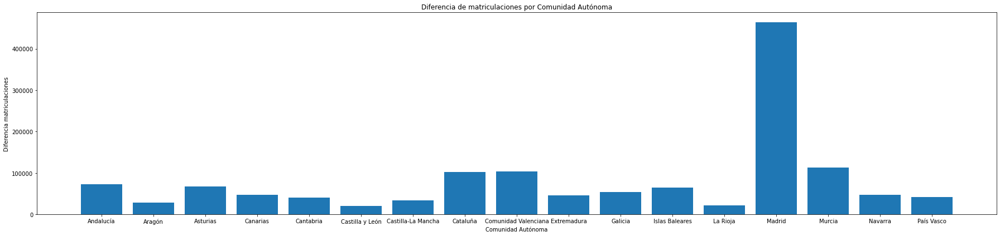

In [36]:
y_values = dm["M_Diesel"]

# Obtener los nombres de las comunidades autónomas
x_values = dm.index
fig,ax  = plt.subplots(1, figsize=(25,6),tight_layout=True)
# Crear el gráfico de barras
plt.bar(x_values, y_values)

# Añadir etiquetas a los ejes
plt.xlabel("Comunidad Autónoma")
plt.ylabel("Diferencia matriculaciones")
plt.title("Diferencia de matriculaciones por Comunidad Autónoma")

# Mostrar el gráfico
plt.show()

#### Se ve que hay zonas con mas matriculaciones, sobretodo ciudades grandes como Cataluña, Valencia y en Especial Madrid dado que las familias tienden a tener muchos coches por familia, a diferencia de otras zonas mas montañosas o más rurales que acostumbran a mantener los vehiculos prolongadamente y a no acaparar muchos sin sentido.

#### En cambio cuando vemos la relacion entre el consumo y las matriculaciones podemos observar que comunidades como las tres anteriormente nombradas no solo tienen un bajo consumo sino que tienen los más bajos de todos siendo madrid la menos consumidora

#### Esto se debe primordialmente a que la mayoria de vehiculos no estan en uso sino parados y ademas, la mayoria de los vehiculos te transporte publico son diesel o electricos, al ser un servicio muy utilizado sobretodo en estas comunidades es razonable que el consumo sea mas bajo, aun teniendo esas desorbitantes cifras de matriculaciones

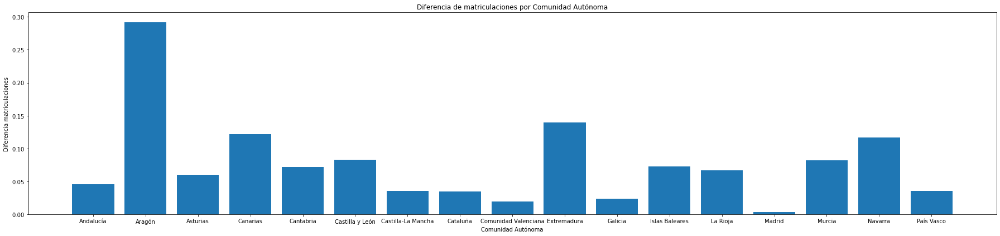

In [37]:

y_values = dm["Rel_M/C"]

# Obtener los nombres de las comunidades autónomas
x_values = dm.index
fig,ax  = plt.subplots(1, figsize=(25,6),tight_layout=True)
# Crear el gráfico de barras
plt.bar(x_values, y_values)

# Añadir etiquetas a los ejes
plt.xlabel("Comunidad Autónoma")
plt.ylabel("Diferencia matriculaciones")
plt.title("Diferencia de matriculaciones por Comunidad Autónoma")

# Mostrar el gráfico
plt.show()


#### Zonas mas montañosas , de terreno inclinado, con carreteras mas extensas y mas necesidad vehicular tienen consumos mayores, no solo por que son mayormente utilizadas por vehiculos de transporte sino por vehiculos de trabajo como tractores que son diesel y consumen mucho mas al igual que los cambones y por los terrenos sobre los que se circula que al ser mas empinados o complicados procuran un consumo mayor

#### Aqui podemos ver la comparativa entre las comunidades vistas enteriormente y el numero de matriculaciones de turismos o vehuiculos como camionetas y camiones de transporte publico sobretodo


Matriculaciones de Turismos Por comunidad



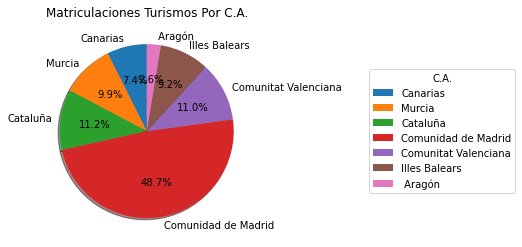

In [39]:
print('\nMatriculaciones de Turismos Por comunidad\n')
com = []
f = []
for val in matr['C.A']:
    if val not in com:
        com.append(val)
com = sorted(com)
for c in com:
    a = matr['A2019'].loc[((matr['C.A'] == c)
    & (matr['Tipo_Vehiculo'] == 'Turismos'))]
    a = round(a.mean())
    f.append(c)
    f.append(a)
    
labels = ('Canarias','Murcia','Cataluña','Comunidad de Madrid','Comunitat Valenciana', 
          'Illes Balears',' Aragón')

sizes = [294070,392058, 445028, 1933031,436846,367054,103003]

fig1 , ax1 = plt.subplots()

ax1.pie(sizes, labels = labels, autopct = '%1.1f%%',
       shadow = True, startangle = 90)

ax1.legend ( 
           title = "C.A.",
          loc = "center left",
          bbox_to_anchor = (1.5, 0, 0.5, 1))

ax1.set_title("Matriculaciones Turismos Por C.A.")
plt.show()

#### Como vemos, las ciudades con menor consumo son las que mas turismo tienen, madrid siendo la dominante y con el consumo mas bajo, siendo seguida por cataluña y la comunitat valenciana y viendo como aragon, tiene una tas amuy baja de matriculaciones de turismos pero el consumo mas alto de todos

#### Lo mismo podemos decir con las matriculaciones de autobuses,  en estas ciudades con menor consumo, predominan los autobuses, en madrid sobretodo pero a diferencia de antes en las islas canarias y baleares hay mas porcentaje que en valencia, cataluña o murcia. Lo que indica mas turismo pero sigue afectando a mantener un bajo consumo en comparación


Matriculaciones de Autobuses Por comunidad



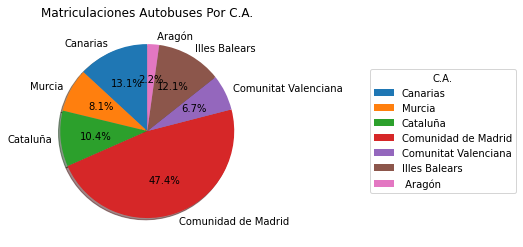

In [40]:
print('\nMatriculaciones de Autobuses Por comunidad\n')
com = []
f = []
for val in matr['C.A']:
    if val not in com:
        com.append(val)
com = sorted(com)
for c in com:
    a = matr['A2019'].loc[((matr['C.A'] == c)
    & (matr['Tipo_Vehiculo'] == 'Autobuses'))]
    a = round(a.mean())
    f.append(c)
    f.append(a)

labels = ('Canarias','Murcia','Cataluña','Comunidad de Madrid','Comunitat Valenciana', 
          'Illes Balears',' Aragón')

sizes = [1524,938, 1204,5500, 772, 1408, 255]

fig1 , ax1 = plt.subplots()

ax1.pie(sizes, labels = labels, autopct = '%1.1f%%',
       shadow = True, startangle = 90)

ax1.legend (  title = "C.A.",
          loc = "center left",
          bbox_to_anchor = (1.5, 0, 0.5, 1))
ax1.set_title("Matriculaciones Autobuses Por C.A.")
plt.show()

#### Por ultimo podemos ver las diferencias entre  matriculaciones de diesel y gasolina. En la mayoria de lugares estan muy a la par aun que en Madrid se ve una predominancia de vehiculos diesel, sobretodo de transporte de mercancias al igual que en Murcia, estos vehiculos al ir primordialemente por autopistas consumen poco. 
#### En cambio podemos ver como las islas Canarias y Baleares y Cataluña tienen una mayor cantidad de matriculaciones de Gasolina, esto se debe al terreno en el que se encuentran, los vehiculos de Diesel permiten tener motores mas pequeños con mucha potencia a bajas revoluciones, perfecto para las autopistas por ejemplo mientras que para distancias cortas y terrenos muy variantes como las islas es mejor tener un motor Gasolina. Además esto también es condicionado por las cantidades de combustible que se exportan a las islas, este primordialmente es gasolina a diferencia de el resto de España

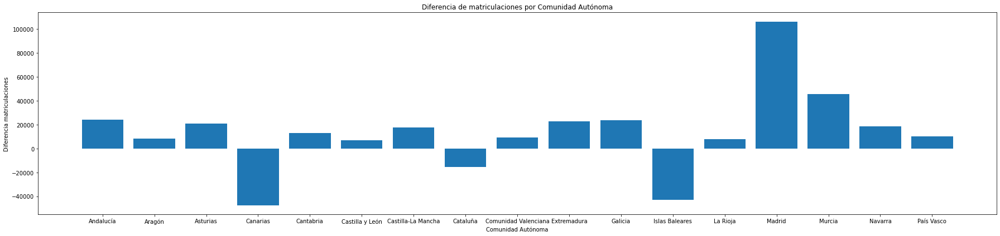

In [41]:
y_values = dm["Dif_matr"]

# Obtener los nombres de las comunidades autónomas
x_values = dm.index
fig,ax  = plt.subplots(1, figsize=(25,6),tight_layout=True)
# Crear el gráfico de barras
plt.bar(x_values, y_values)

# Añadir etiquetas a los ejes
plt.xlabel("Comunidad Autónoma")
plt.ylabel("Diferencia matriculaciones")
plt.title("Diferencia de matriculaciones por Comunidad Autónoma")

# Mostrar el gráfico
plt.show()